In [1]:
import torch
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
import os
import sys
import matplotlib.pyplot as plt
import numpy as np
import torch.optim as optim
from tqdm import tqdm
import scipy

parent_dir = os.path.abspath(os.path.join(os.getcwd(), '..'))

sys.path.append(os.path.join(parent_dir, 'model'))
sys.path.append(os.path.join(parent_dir, 'loss'))

from model import VAE        
from loss import VAELoss


In [2]:
## HYPERPARAMETERS

BATCH_SIZE = 32
BETA = 1
SIZES = [64,128,256]
LATENT_SIZE = 225
LEARNING_RATE = 1e-4
EPOCHS = 201
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

In [3]:
# BATCH_SIZE = 32
# BETA = 0.1
# SIZES = [256, 256, 256, 256]
# LATENT_SIZE = 224
# LEARNING_RATE = 5e-5
# EPOCHS = 320
# DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

In [4]:
transform = transforms.Compose(
    [
        transforms.Resize((256,256)),
        transforms.ToTensor(),
    ]
)


In [5]:
test_dataset = torchvision.datasets.CIFAR10(
    root='../data',
    train=False,
    download=True,
    transform=transform
)

In [6]:
test_dataset = torchvision.datasets.STL10(
    root='../data',
    download=True,
    transform=transform
)

In [7]:
test_dataset = torchvision.datasets.Flowers102(
    root='../data', 
    download=True, 
    transform=transform
    )

Number of classes: 102


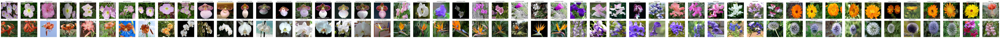

In [8]:

classes = test_dataset.classes

N = len(classes)
print(f"Number of classes: {N}")

# Set grid size (5 per row)
cols = N//2
rows = (N + cols - 1) // cols  # round up

fig, axes = plt.subplots(rows, cols, figsize=(cols * 2, rows * 2))

for i in range(N):
    img, label = test_dataset[i]
    img = img.permute(1, 2, 0).numpy()

    row = i // cols
    col = i % cols
    ax = axes[row, col] if rows > 1 else axes[col]
    ax.imshow(img)
    ax.set_title(f"{classes[label]}", fontsize=8)
    ax.axis('off')

plt.tight_layout()
plt.show()

In [9]:
data_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=True)
input_shape = test_dataset[0][0].shape
print(f"Input shape : {input_shape}")

Input shape : torch.Size([3, 256, 256])


In [10]:
#define the model
vae = VAE(
    input_shape = input_shape,
    latent_size = LATENT_SIZE
).to(DEVICE)

loss = VAELoss(beta= BETA)
optimizer = optim.Adam(vae.parameters(), lr=LEARNING_RATE, weight_decay=1e-5)

In [11]:
def visualize_reconstruction(vae, data_loader, device, num_samples=1):
    vae.eval()
    with torch.no_grad():
        sample_images, _ = next(iter(data_loader))
        sample_images = sample_images[:num_samples].to(device)
        recon_samples, _, _ = vae(sample_images)

        # Prepare figure
        fig, axes = plt.subplots(2, num_samples, figsize=(num_samples * 2, 4))

        for i in range(num_samples):
            # Original
            img = sample_images[i].cpu().permute(1, 2, 0).numpy()
            axes[0, i].imshow(img)
            axes[0, i].axis('off')
            axes[0, i].set_title('Original' if i == 0 else '')

            # Reconstruction
            recon = recon_samples[i].cpu().permute(1, 2, 0).numpy()
            axes[1, i].imshow(recon)
            axes[1, i].axis('off')
            axes[1, i].set_title('Reconstruction' if i == 0 else '')

        plt.tight_layout()
        plt.show()

def save_checkpoint(state, filename='vae_checkpoint.pth'):
    torch.save(state, filename)
    print(f"Checkpoint saved to {filename}")

Epoch [1/201] Average Loss: 18173.1846


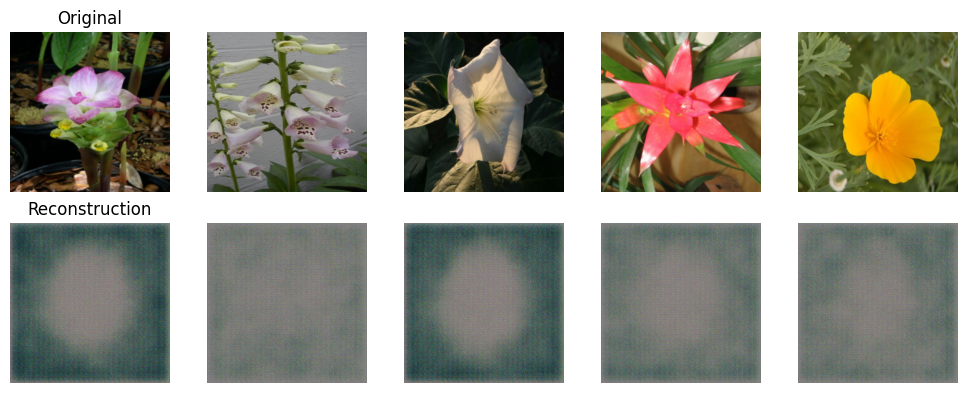

Checkpoint saved to vae_checkpoint.pth


Epoch [51/201] Average Loss: 2475.6046


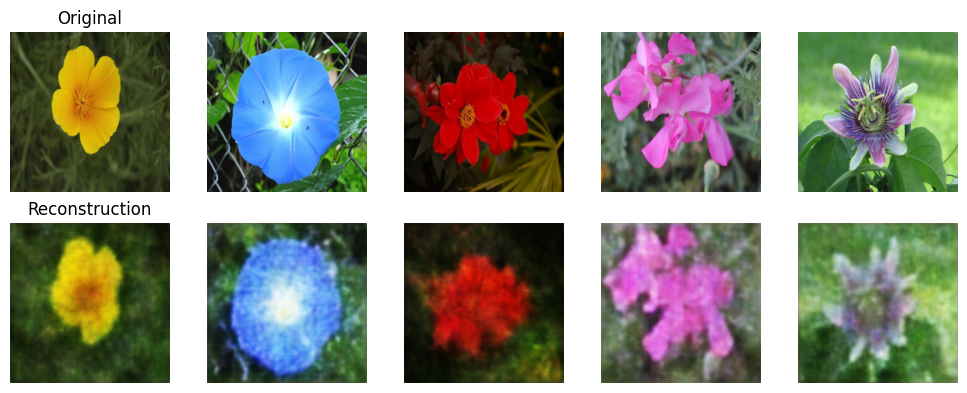

Checkpoint saved to vae_checkpoint.pth


Epoch [101/201] Average Loss: 1705.4726


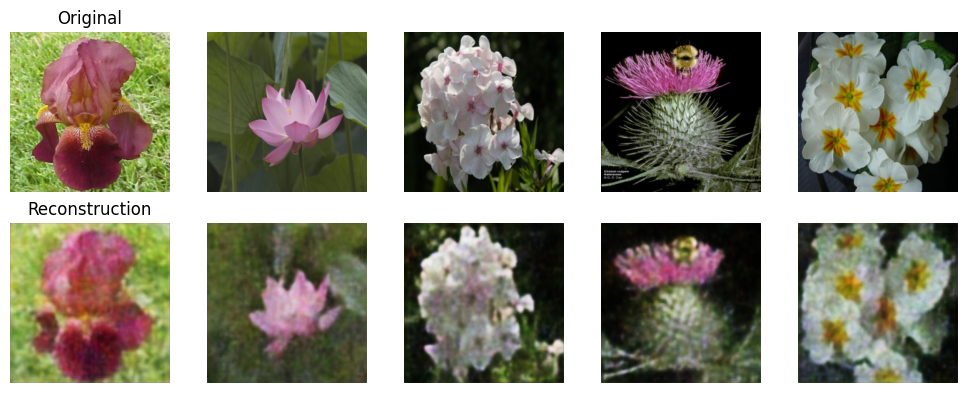

Checkpoint saved to vae_checkpoint.pth


Epoch [151/201] Average Loss: 1439.6253


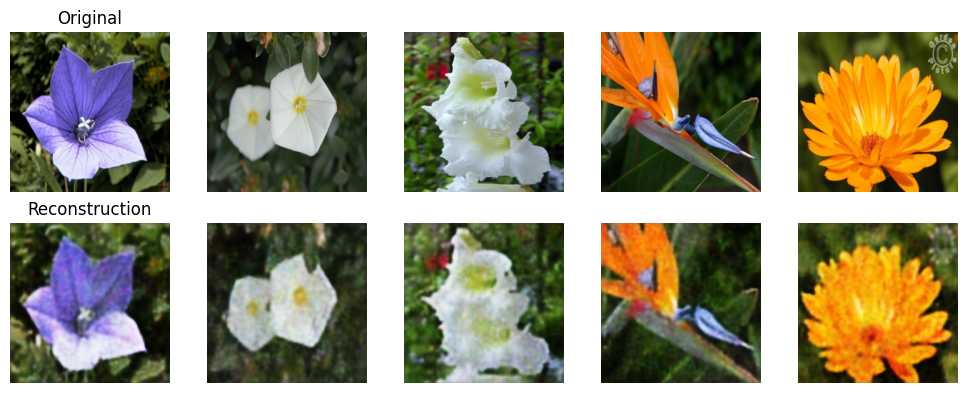

Checkpoint saved to vae_checkpoint.pth


Epoch [201/201] Average Loss: 1312.3890


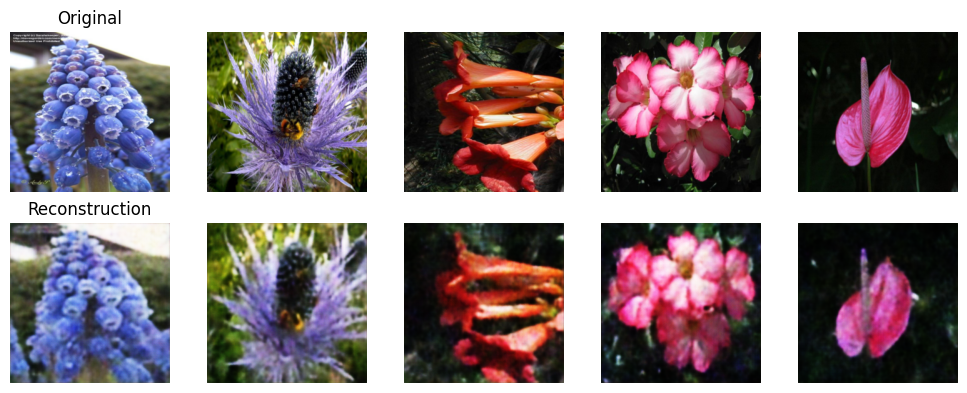

Checkpoint saved to vae_checkpoint.pth


In [12]:
#train


for epoch in range(1,EPOCHS+1):

    running_loss = 0.0
    progress_bar = tqdm(data_loader, desc=f"Epoch [{epoch}/{EPOCHS}]", leave=False)
    vae.train()
    for batch_idx, (images, _) in enumerate(progress_bar):

        images = images.to(DEVICE)

        optimizer.zero_grad()

        reconstructed_images , mean, log_var = vae(images)

        total_loss, reconstructed_loss, kl_loss = loss(images, reconstructed_images, mean, log_var, 1.0*epoch/EPOCHS)

        total_loss.backward()

        optimizer.step()

        running_loss += total_loss.item()

        if torch.isnan(total_loss):
            pass

        progress_bar.set_postfix({
        'Total Loss': f"{total_loss.item():.4f}",
        'Recon': f"{reconstructed_loss.item():.4f}",
        'KL': f"{kl_loss.item():.4f}",
        })

    avg_loss = running_loss / len(data_loader)
    if ((epoch -1 )% 50 == 0):
        print(f"Epoch [{epoch}/{EPOCHS}] Average Loss: {avg_loss:.4f}")
        visualize_reconstruction(vae, data_loader, DEVICE, num_samples=5)
        save_checkpoint(vae)
        

In [ ]:
batch_size = 50

# Generate random latent vectors
z = torch.randn(batch_size, LATENT_SIZE).to(DEVICE)

# Decode
decoded_output = vae.decode(z)  # shape: [50, C, H, W]

# Loop over and plot each image
for i in range(batch_size):
    img = decoded_output[i].detach().cpu().permute(1, 2, 0).numpy()
    plt.figure()
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Sample {i}")
    plt.show()



In [23]:

from collections import defaultdict

vae.eval()  # set to eval mode

# Store z vectors by class
z_by_class = defaultdict(list)

with torch.no_grad():
    for images, labels in data_loader:
        images = images.to(DEVICE)
        labels.to(DEVICE)

        # Encode to get z
        z, mean, log_var = vae.encoder(images)  # shape: [batch, latent_dim]

        for i in range(images.size(0)):
            class_label = labels[i].item()
            z_by_class[class_label].append(z[i].cpu())

# Compute mean and std for each class
for class_label, z_list in z_by_class.items():
    z_stack = torch.stack(z_list)  # shape: [num_samples, latent_dim]
    class_mean = z_stack.mean(dim=0)
    class_std = z_stack.std(dim=0)

    print(f"Class {class_label}:")
    print(f"  Mean (shape {class_mean.shape}): {class_mean}")
    print(f"  Std  (shape {class_std.shape}): {class_std}")


Class 7:
  Mean (shape torch.Size([225])): tensor([-1.4485e+00,  1.0448e-01, -1.6430e-02, -5.4956e-01, -6.5047e-03,
         5.0141e-01,  4.4937e-01,  1.0830e-02,  3.9023e-02,  2.4874e-01,
        -9.0344e-01,  2.6654e-01, -1.5934e-01,  2.6089e-01, -5.9162e-01,
        -5.3426e-01, -8.2700e-01,  1.6708e-02, -3.8568e-01,  3.4959e-01,
         3.9986e-01,  2.5204e-01,  3.5597e-01,  3.8302e-01, -2.0373e-03,
         1.1701e-01, -7.6169e-01, -2.4053e-01, -5.9751e-02, -2.1885e-02,
         5.1186e-01,  9.0416e-01,  6.2792e-01,  4.1944e-01,  4.8556e-01,
         3.4726e-01, -4.1811e-01,  1.0230e+00,  2.6723e-01, -6.2777e-01,
         3.4307e-01, -5.3021e-02, -9.0181e-01, -4.2711e-01,  7.4507e-02,
        -7.9455e-02,  7.2348e-01, -1.5629e+00, -4.3247e-01,  6.8798e-03,
        -7.8575e-01,  6.4784e-01, -3.3112e-01, -2.9299e-02, -2.6161e-02,
        -3.1341e-01,  2.1031e-02, -4.7745e-01,  9.8123e-01,  4.1319e-01,
         1.5797e-02,  5.1754e-01,  6.5148e-01, -6.2806e-01, -6.5555e-01,
        

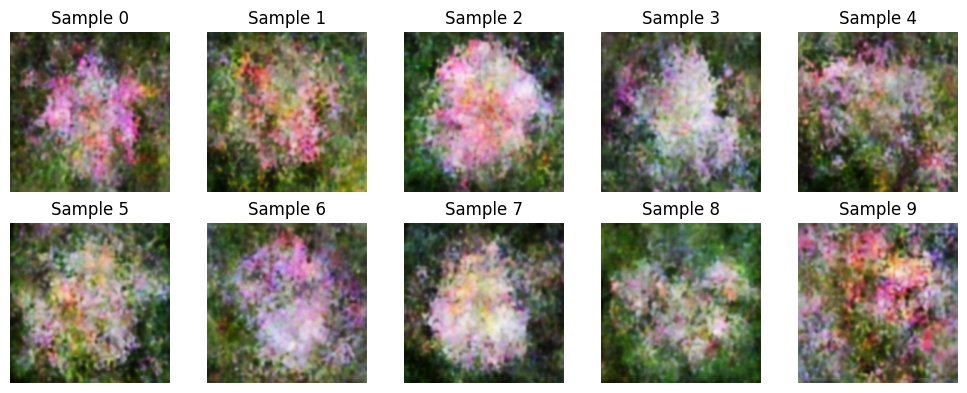

In [ ]:
import math
import torch

vae.eval()

# Select class to generate from
target_class = 5
num_samples = 10  # how many samples to generate

if target_class not in z_by_class:
    print(f"No latent vectors collected for class {target_class}")
else:
    z_list = z_by_class[target_class]
    z_stack = torch.stack(z_list)  # shape: [num_class_samples, latent_dim]

    # Compute class mean and std
    class_mean = z_stack.mean(dim=0)
    class_std = z_stack.std(dim=0)

    cols = 5  # number of columns in the grid
    rows = math.ceil(num_samples / cols)

    fig, axes = plt.subplots(rows, cols, figsize=(cols * 2, rows * 2))

    for i in range(num_samples):
        # Sample epsilon ~ N(0, 1)
        epsilon = torch.randn_like(class_std)

        # Sample latent vector: mean + epsilon * std
        sampled_z = class_mean + epsilon * class_std
        sampled_z = sampled_z.unsqueeze(0).to(DEVICE)

        # Decode
        generated_img = vae.decode(sampled_z)
        generated_img = generated_img.squeeze(0).detach().cpu().permute(1, 2, 0).numpy()

        # Plot
        ax = axes.flat[i]
        ax.imshow(generated_img)
        ax.axis('off')
        ax.set_title(f"Sample {i}")

    # Hide any unused subplots
    for j in range(num_samples, len(axes.flat)):
        axes.flat[j].axis('off')

    plt.tight_layout()
    plt.show()
